# Homework 8
**Total Points: 5**

**Instructions:**
1. Complete parts 1 through 5, filling in code or responses where marked with `# YOUR CODE HERE` or `# YOUR ANALYSIS HERE`.
2. The libraries you need have already been coded. Do not import additional libraries or move import commands.
3. When finished, run the full notebook by selecting <b>Kernel > Restart & Run All</b>. </li>
4. Submit this completed notebook file to <b>NYU Classes</b>. </li>**(Important: Only submit your .ipynb file! Do not submit the entire dataset.)**

In this assignment you will test several different techniques to estimate pitches (f0) over time of monophonic audio signals. This assignment uses a new library, `crepe`, which contains additional signal processing tools. More information about the library is available here: 

<blockquote>
Kim, Jong Wook, et al. "CREPE: A convolutional representation for pitch estimation." 2018 IEEE International Conference on Acoustics, Speech and Signal Processing (ICASSP). IEEE, 2018
</blockquote>

**Grading:** Each part is worth 1 point.

## Prologue: Download Data and Crepe

All audio and data files are included with this assignment. Additionally, **Crepe** is a pitch tracking algorithm. You can download and install is using `pip install crepe` from the command line. 
    
Download and extract both the dataset and the pitch tracking data. Place the data into folders in the same directory as your `Homework-8.ipynb` file, such that the folder stucture is:

`
 <--   Homework-8.ipynb
 <--   data
 |     <--   *.txt files      
 <--   audio 
 |     <--   *.wav files
`

The `*.wav` audio files contain recordings of different solo instruments. Each audio file has a matching filename `*.txt`, which contains ground truth times for pitch tracking, with each line containing the following information:

`time     frequency`

To import this information, use `numpy.loadtxt()`. To get all the filenames in a specific directory, use the `os` library as follows, where each row contains the following data:

`
for filename in os.listdir("audio/"):
    if filename.endswith(".wav"):
        ...
`

Portions of the dataset used in this assignment are from `MedleyDB-Pitch`.

<blockquote>
Bittner, R., Wilkins, J., Yip, H., & Bello, J. (2016). MedleyDB 2.0: New Data and a System for Sustainable Data Collection. New York, NY, USA: International Conference on Music Information Retrieval (ISMIR-16).
</blockquote>

In [173]:
import numpy as np
import matplotlib.pyplot as plt
import crepe
import librosa
import librosa.display
import IPython
from mir_eval.melody import evaluate
from mir_eval.sonify import pitch_contour
import mir_eval
import madmom
from madmom.features.beats import RNNBeatProcessor

In [2]:
def get_truth(file_dir):
    '''Get truth data from text file.
    
    Parameters
    ----------
    file_dir : str
        File name (*.txt) and path to ground truth

    Returns
    -------
    times : np.array
        stimes of each frequency
    frequencies: np.array
        Estimated frequency at corresponding time
        
    '''
    
    times = np.array([])
    frequencies = np.array([])
    data = np.loadtxt(file_dir)
    for i in data:
        times = np.append(times,i[0])
        frequencies = np.append(frequencies,i[1])
    return times, frequencies


In [3]:
# Test  mir_eval's pitch_countour() and the included get_truth() code
# This code shows how these functions work

file = "003"
time_test, freq_test = get_truth("pitch/" + file + ".txt")
pc2, sr = librosa.load("audio/" + file + ".wav")
pc = pitch_contour(time_test,freq_test, fs=sr)
a1 = IPython.display.Audio(pc,rate=sr)
a2 = IPython.display.Audio(pc2,rate=sr)

print("Real Audio:")
IPython.display.display(a2)
print("Synthesized Ground Truth Pitch Contour:")
IPython.display.display(a1)


Real Audio:


Synthesized Ground Truth Pitch Contour:


## Part 1: Estimate Pitch

Write a function `estimate_pitch()` which provides pitch estimation for a momphonic audio signal over time using the following methods (most of these have prewritten library functions): 

- spectrogram argmax for each m in the STFT matgnitude spectrum
- time domain autocorrelation (see https://musicinformationretrieval.com/autocorrelation.html)
- YIN
- the Crepe pitch tracking algorithm

See Crepe's documentation [here](https://github.com/marl/crepe). *Hint:* Look for the section in the readme titled "using crepe inside python". Note that you can use `librosa`, instead of `scipy` to load audio.

Notes:
voicing_threshold and argmax:

You can use argmax on just a regular STFT or a salience representation matrix (using librosa's salience function). You should get better results using salience. Threshold on the maximum salience amplitude or waveform energy; set anything below that threshold to zero. Then, choose the frequency with maximum amplitude for each time frame. That will be your F0 estimation for that frame.

VITERBI
Only for Crepe not otheres
Only use Viterbi on functions that call for it; don't implement it yourself. If you decide to implement it yourself, discuss what you did in your analysis. For those interested, pages 292-293 of the FMP book discuss the transition probability matrix in more detail.


In [163]:
def estimate_pitch(audio_path, alg, N=2048, voicing_threshold=0.7, use_viterbi=True):
    """Estimate the pitch of an audio_path using one of the 4 above algorithm, and using a threshold
       on the voicing confidence to determine when frames are unvoiced.
    
    Parameters
    ----------
    audio_path : str
        Path to input audio file
    N : int
        frame length, if applicable
    voicing_threshold : float
        Threshold on the voicing to determine which frames are unvoiced.
    alg : str
        one of 'autocorrelation', 'argmax', 'yin', or 'crepe' 
    use_viterbi : bool
        If True, use the Viterbi algorithm to select the final output
    
    Returns
    -------
    times : np.ndarray shape=(T,)
        Numpy array of time stamps of length T in seconds
    frequencies : np.ndarray shape=(T,)
        Numpy array of predicted frequency values in Hz

    """
    audio, sr = librosa.load(audio_path)
    hop_size = int(N/4)
    
    # 1 spectrogram argmax for each m in the STFT matgnitude spectrum
    # voicing_threshold should be applied to the salience representation of STFT for "argmax" method
    if (alg == "spectrogram"):
        S = np.abs(librosa.stft(audio))
        freqs = librosa.core.fft_frequencies(sr)
        harms = [1, 2, 3, 4]
        weights = [1.0, 0.5, 0.33, 0.25]
        S_sal = librosa.salience(S, freqs, harms, weights, fill_value=0)
        p_maximums = np.argmax(S_sal, axis=0) # 0 for rows
        freqs = librosa.fft_frequencies(sr=sr, n_fft=2048)
        maximums = np.array([])
        counter = 0
        for i in p_maximums:
            t = p_maximums[counter]
            maximums = np.append(maximums,freqs[t])
            counter += 1
        temp = S_sal.shape[1] # for cols
        time = np.linspace(0, len(audio)/sr, temp)
        return (time, maximums)
    
    # 2 time domain autocorrelation     
    if (alg == "autocorrelation"):
        y = np.array([])
        for i in range(0, len(audio), N):
            f_hi = 1200
            f_lo = 55
            t_lo = sr/f_hi
            t_hi = sr/f_lo
            r = librosa.autocorrelate(audio[i:i+N])
            r[:int(t_lo)] = 0
            r[int(t_hi):] = 0
            t_max = r.argmax()
            in_hz = float(sr)/t_max
            y = np.append(y, in_hz)
        time = np.linspace(0, len(audio)/sr, int(len(audio)/N)+1)
        return (time, y)
        
    # 3 YIN
    if (alg == "yin"):
        y = librosa.yin(audio, 55, 1200, sr)
        time = np.linspace(0, len(audio)/sr, y.shape[0])
        return (time, y)
    
    # 4 Crepe pitch tracking algorithm
    if (alg == "crepe"):
        time, frequency, confidence, activation = crepe.predict(audio, sr, viterbi=True)
        return (time, frequency)


Spectrogram:
Synthesized Pitch Contour:


Autocorrelation:
Synthesized Pitch Contour:


YIN:
Synthesized Pitch Contour:


Crepe:
76/76 [==============================] - 73s 962ms/step
Synthesized Pitch Contour:


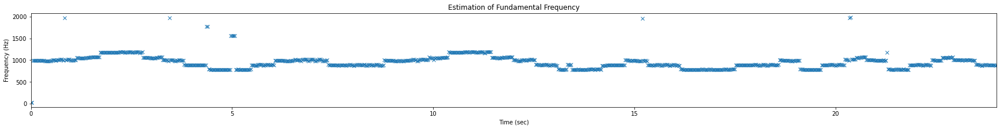

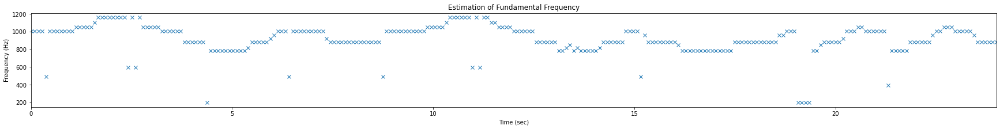

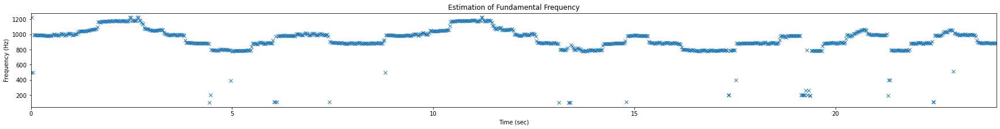

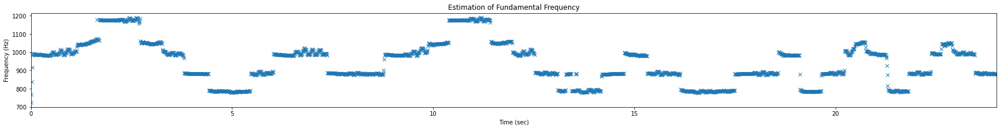

In [164]:
top = "audio/"
file = "003"
audio_path = top + file + ".wav"

print("Spectrogram:")
alg = 'spectrogram'
times, frequencies = estimate_pitch(audio_path, alg, N=2048, voicing_threshold=0.7, use_viterbi=False)
plot_and_sonify(times, frequencies)

print("Autocorrelation:")
alg = 'autocorrelation'
times, frequencies = estimate_pitch(audio_path, alg, N=2048, voicing_threshold=0.7, use_viterbi=False)
plot_and_sonify(times, frequencies)

print("YIN:")
alg = 'yin'
times, frequencies = estimate_pitch(audio_path, alg, N=2048, voicing_threshold=0.7, use_viterbi=False)
plot_and_sonify(times, frequencies)

print("Crepe:")
alg = 'crepe'
times, frequencies = estimate_pitch(audio_path, alg, N=2048, voicing_threshold=0.7, use_viterbi=True)
plot_and_sonify(times, frequencies)

## Part 2: Plot and Sonify Pitch Contour

Create a function `plot_and_sonify()` that will plot all 4 estimated pitch contours in a single figure with 4 subplots (4 rows and 1 column). The function should also create 4 IPython audio players, one for each of the pitch contours. See the example in the Prologue for assistance with creating the pitch contour audio file.

**Hint:** To plot the pitch contour, use `plt.plot(time, frequency,'x')` so that each plot doesn't have connecting lines to each other. Also ensure that the axes are properly labeled.

Notes

The instructions state that one function should generate 4 plots; however, this conflicts with the previous function's plotting. One workaround I recommend is to call that function 4 times instead of calling it once and generating 4 plots.

In [113]:
def plot_and_sonify(times, frequencies):
    ''' Plot and sonify the estimated pitches of an audio file
    
    Parameters
    ----------
    times : np.ndarray shape=(T,)
        Numpy array of time stamps of length T in seconds
    frequencies : np.ndarray shape=(T,)
        Numpy array of predicted frequency values in Hz
        
    Returns
    -------
    none
    
    '''
    ## PLOT
    plt.figure(figsize=(30, 3))
    plt.plot(times, frequencies, 'x')
    plt.xlabel("Time (sec)")
    plt.ylabel("Frequency (Hz)")
    plt.title("Estimation of Fundamental Frequency")
    plt.xlim(0, np.max(times))
    
    ## SONIFY
    pc = pitch_contour(times,frequencies, fs=22050)
    a1 = IPython.display.Audio(pc,rate=sr)
    print("Synthesized Pitch Contour:")
    IPython.display.display(a1)

## Part 3: Evaluate Results

There are a total of 9 audio files (000 - 008) with corresponding truth pitch contours. Using the `mir_eval` `evaluate` function, calculate the overall accuracy of each file, for all 4 pitch tracking algorithms (this may require a nested loop).

1. Find the algorithn with the overall best accuracy and the algorithm with the overall worst accuracy.
2. Find the audio file that has the best accuracy and the audio file with the worst accuracy.
3. Plot and sonify both of those pitch contours.

In [169]:
#Evaluate results. Please uncomment print lines to see the 'overall accuracy' results printed out.
file_path = "pitch/"
top = "audio/"
files = ["000", "001", "002", "003", "004", "005", "006", "007", "008"]
for file in files:
    ref_time, ref_freq = mir_eval.io.load_time_series(file_path + file +".txt")
    alg = 'spectrogram'
    est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=False)
    score = mir_eval.melody.evaluate(ref_time, ref_freq, est_time, est_freq)
    #print("File " + file + ", Algorithm: " + alg + ", Overall Accuracy:")
    #print (score['Overall Accuracy'])
    
    alg = 'autocorrelation'
    est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=False)
    score = mir_eval.melody.evaluate(ref_time, ref_freq, est_time, est_freq)
    #print("File " + file + ", Algorithm: " + alg + ", Overall Accuracy:")
    #print (score['Overall Accuracy'])
    
    alg = 'yin'
    est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=False)
    score = mir_eval.melody.evaluate(ref_time, ref_freq, est_time, est_freq)
    #print("File " + file + ", Algorithm: " + alg + ", Overall Accuracy:")
    #print (score['Overall Accuracy'])
    
    alg = 'crepe'
    est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)
    score = mir_eval.melody.evaluate(ref_time, ref_freq, est_time, est_freq)
    #print("File " + file + ", Algorithm: " + alg + ", Overall Accuracy:")
    #print (score['Overall Accuracy'])

# 1. Find the algorithn with the overall best accuracy and the algorithm with the overall worst accuracy.

# The algorithm with the overall best accuracy is CREPE. It has an average accuracy of 0.801 
# The algorithm with the overall worst accuracy is spectrogram argmax. It has an average accuracy of 0.512 

# 2. Find the audio file that has the best accuracy and the audio file with the worst accuracy.

# The audio file with the best accuracy is file 003. It has an average accuracy of 0.906
# The audio file with the worst accuracy is file 000. It has an average accuracy of 0.410
# I am realy amazed at how varied the results are between different files!



File 000, Algorithm: spectrogram, Overall Accuracy:
0.1280305093979842
File 000, Algorithm: autocorrelation, Overall Accuracy:
0.4058839553255244
File 000, Algorithm: yin, Overall Accuracy:
0.5723236175429038
67/67 [==============================] - 55s 814ms/step
File 000, Algorithm: crepe, Overall Accuracy:
0.5336420593843639
File 001, Algorithm: spectrogram, Overall Accuracy:
0.7272066836178714


<ipython-input-163-a92d43e35844>:61: RuntimeWarning: divide by zero encountered in true_divide
  in_hz = float(sr)/t_max


File 001, Algorithm: autocorrelation, Overall Accuracy:
0.8423537958590629
File 001, Algorithm: yin, Overall Accuracy:
0.8808572466400291


/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/crepe/core.py:209: RuntimeWarning: invalid value encountered in true_divide
  frames /= np.std(frames, axis=1)[:, np.newaxis]


51/51 [==============================] - 37s 721ms/step
File 001, Algorithm: crepe, Overall Accuracy:
0.9607700690156193
File 002, Algorithm: spectrogram, Overall Accuracy:
0.8302618816682832


<ipython-input-163-a92d43e35844>:61: RuntimeWarning: divide by zero encountered in true_divide
  in_hz = float(sr)/t_max
/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/mir_eval/melody.py:637: RuntimeWarning: invalid value encountered in subtract
  correct_chroma = np.abs(freq_diff_cents - octave) < cent_tolerance
/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/mir_eval/melody.py:637: RuntimeWarning: invalid value encountered in less
  correct_chroma = np.abs(freq_diff_cents - octave) < cent_tolerance


File 002, Algorithm: autocorrelation, Overall Accuracy:
0.3375363724539282
File 002, Algorithm: yin, Overall Accuracy:
0.3564500484966052


/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/crepe/core.py:209: RuntimeWarning: invalid value encountered in true_divide
  frames /= np.std(frames, axis=1)[:, np.newaxis]


38/38 [==============================] - 27s 719ms/step
File 002, Algorithm: crepe, Overall Accuracy:
0.8482056256062076
File 003, Algorithm: spectrogram, Overall Accuracy:
0.9346246973365617
File 003, Algorithm: autocorrelation, Overall Accuracy:
0.8375302663438257
File 003, Algorithm: yin, Overall Accuracy:
0.8973365617433414
76/76 [==============================] - 56s 734ms/step
File 003, Algorithm: crepe, Overall Accuracy:
0.9530266343825666
File 004, Algorithm: spectrogram, Overall Accuracy:
0.3980933596318212


<ipython-input-163-a92d43e35844>:61: RuntimeWarning: divide by zero encountered in true_divide
  in_hz = float(sr)/t_max
/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/mir_eval/melody.py:637: RuntimeWarning: invalid value encountered in subtract
  correct_chroma = np.abs(freq_diff_cents - octave) < cent_tolerance
/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/mir_eval/melody.py:637: RuntimeWarning: invalid value encountered in less
  correct_chroma = np.abs(freq_diff_cents - octave) < cent_tolerance


File 004, Algorithm: autocorrelation, Overall Accuracy:
0.5950032873109796
File 004, Algorithm: yin, Overall Accuracy:
0.5571992110453649


/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/crepe/core.py:209: RuntimeWarning: invalid value encountered in true_divide
  frames /= np.std(frames, axis=1)[:, np.newaxis]


59/59 [==============================] - 44s 750ms/step
File 004, Algorithm: crepe, Overall Accuracy:
0.7439184746877054
File 005, Algorithm: spectrogram, Overall Accuracy:
0.5768983268983269
File 005, Algorithm: autocorrelation, Overall Accuracy:
0.796010296010296
File 005, Algorithm: yin, Overall Accuracy:
0.7982625482625483
59/59 [==============================] - 44s 739ms/step
File 005, Algorithm: crepe, Overall Accuracy:
0.9066924066924067
File 006, Algorithm: spectrogram, Overall Accuracy:
0.3561643835616438
File 006, Algorithm: autocorrelation, Overall Accuracy:
0.5354919053549191
File 006, Algorithm: yin, Overall Accuracy:
0.6606475716064757
31/31 [==============================] - 21s 673ms/step
File 006, Algorithm: crepe, Overall Accuracy:
0.8462017434620175
File 007, Algorithm: spectrogram, Overall Accuracy:
0.2514164305949009
File 007, Algorithm: autocorrelation, Overall Accuracy:
0.4171388101983003
File 007, Algorithm: yin, Overall Accuracy:
0.3895184135977337
26/26 [====

<ipython-input-163-a92d43e35844>:61: RuntimeWarning: divide by zero encountered in true_divide
  in_hz = float(sr)/t_max
/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/mir_eval/melody.py:637: RuntimeWarning: invalid value encountered in subtract
  correct_chroma = np.abs(freq_diff_cents - octave) < cent_tolerance
/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/mir_eval/melody.py:637: RuntimeWarning: invalid value encountered in less
  correct_chroma = np.abs(freq_diff_cents - octave) < cent_tolerance


File 008, Algorithm: autocorrelation, Overall Accuracy:
0.4821016166281755
File 008, Algorithm: yin, Overall Accuracy:
0.5395496535796767


/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/crepe/core.py:209: RuntimeWarning: invalid value encountered in true_divide
  frames /= np.std(frames, axis=1)[:, np.newaxis]


64/64 [==============================] - 46s 722ms/step
File 008, Algorithm: crepe, Overall Accuracy:
0.6925519630484989


'\n#alg = \'yin\' # Best algorithm for overall accuracy\nprint("\n")\nfile = "003" # Best file for overall accuracy\nest_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)\nprint ("File 003, Best Overall Accuracy")\nplot_and_sonify(est_time, est_freq)\n\nfile = "000" # Worst file for overall accuracy\nest_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)\nprint ("File 000, Worst Overall Accuracy")\nplot_and_sonify(est_time, est_freq)\n'

/Users/elenageorgieva/opt/anaconda3/lib/python3.8/site-packages/crepe/core.py:209: RuntimeWarning: invalid value encountered in true_divide
  frames /= np.std(frames, axis=1)[:, np.newaxis]


51/51 [==============================] - 36s 707ms/step
File 003, Best Overall Accuracy
Synthesized Pitch Contour:


67/67 [==============================] - 55s 818ms/step
File 000, Worst Overall Accuracy
Synthesized Pitch Contour:


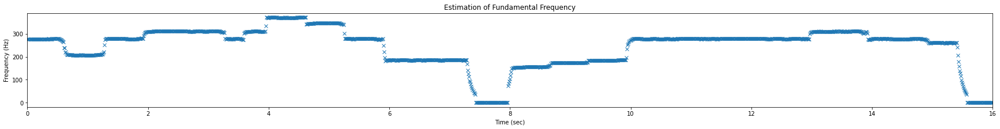

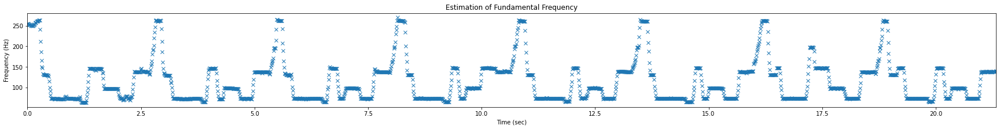

In [170]:
# 3. Plot and sonify both of those pitch contours.
alg = 'crepe' # Best algorithm for overall accuracy
print("\n")
file = "001" # Best file for overall accuracy
est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)
print ("File 003, Best Overall Accuracy")
plot_and_sonify(est_time, est_freq)

file = "000" # Worst file for overall accuracy
est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)
print ("File 000, Worst Overall Accuracy")
plot_and_sonify(est_time, est_freq)


## Part 4: Plot Pitch Contour with Estimated Beats

Select 2 or 3 audio files from this assignment. Plot the best estimated pitch contour for each file (not the reference) and then overlay the plot with vertical lines indicating the best estimated beats (not the reference beats) as obtained from the estimate_beats() function in assignment 7.

1. Copy `estimate_beats()` from Homework 7
2. Use `estimate_pitch()` to get the pitch contour from your selected file(s)
3. Use `estimate_beats()` to get the beats for that file
4. Plot them both together on the same plot.
5. OPTIONAL: Sonify the pitch contour + the estimated beat positions. 

In [90]:
def estimate_beats(audio_path, onset_type, plot=False):
    x, sr = librosa.load(audio_path)
    if (onset_type == "spectral_flux"): # estimate beat positions using a spectral flux onset novelty curve
        y = librosa.onset.onset_strength(x)
    elif (onset_type == "machine_learning"): # estimate using a RNN
        proc = madmom.features.beats.RNNBeatProcessor()
        y = proc(x)
    else:
        print("Please use either 'spectral_flux' or 'machine_learning.'")

    z = librosa.beat.plp(y=None, onset_envelope=y, tempo_min=30,tempo_max=200)
    beats = np.flatnonzero(librosa.util.localmax(z))
    plp_len = z.shape[0]
    beats = beats * (len(x)/sr) / plp_len
    clicks = librosa.clicks(beats,sr=sr) # click track
    return clicks, beats

26/26 [==============================] - 23s 892ms/step


(0.0, 8.21)

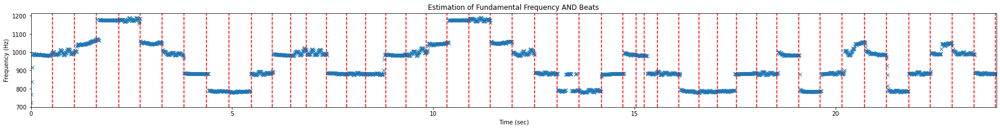

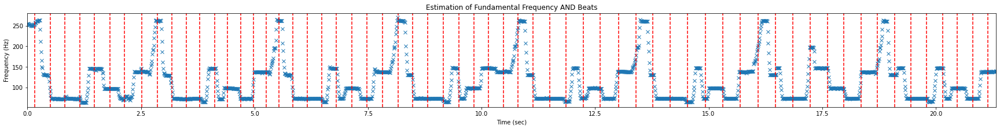

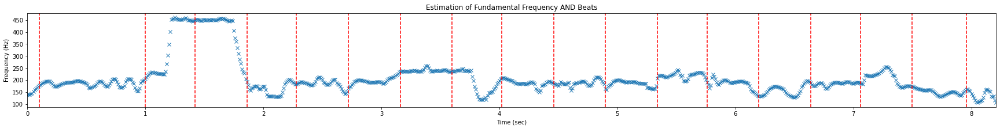

In [187]:
alg = 'crepe' # our best algorithm for overall accuracy
onset_type = 'machine_learning'

#best
file = "003" 
est_beats = estimate_beats(top + file + ".wav", onset_type, plot=False)
est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)
plt.figure(figsize=(30, 3))
plt.plot(est_time, est_freq, 'x')
for xc in est_beats[1]:
    plt.axvline(x=xc, ymin=0, ymax=1, color='r', linestyle='--')
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.title("Estimation of Fundamental Frequency AND Beats")
plt.xlim(0, np.max(est_time))

#worst
file = "000"
est_beats = estimate_beats(top + file + ".wav", onset_type, plot=False)
est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)
plt.figure(figsize=(30, 3))
plt.plot(est_time, est_freq, 'x')
for xc in est_beats[1]:
    plt.axvline(x=xc, ymin=0, ymax=1, color='r', linestyle='--')
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.title("Estimation of Fundamental Frequency AND Beats")
plt.xlim(0, np.max(est_time))

#vocal
file = "007"
est_beats = estimate_beats(top + file + ".wav", onset_type, plot=False)
est_time, est_freq = estimate_pitch(top + file + ".wav", alg, N=2048, voicing_threshold=0.7, use_viterbi=True)
plt.figure(figsize=(30, 3))
plt.plot(est_time, est_freq, 'x')
for xc in est_beats[1]:
    plt.axvline(x=xc, ymin=0, ymax=1, color='r', linestyle='--')
plt.xlabel("Time (sec)")
plt.ylabel("Frequency (Hz)")
plt.title("Estimation of Fundamental Frequency AND Beats")
plt.xlim(0, np.max(est_time))

## Part 5: Analysis

Using the plots from part 2 and the evaluation from part 3, identify 3 trends in the results. Feel free to create additional plots/audio sonifications to identify trends. For each trend, write a short paragraph discussing what is happening and why you think it might be occurring. For example, when and possibly why did the pitch tracking work best and when did the pitch tracking fail?

`# YOUR ANALYSIS HERE`

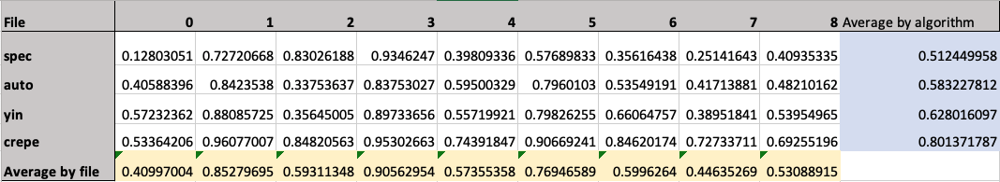

In [ ]:
"""
Above is an attached screenshot of the results of the four different algorithms on the 9 different audio files provided. 
I was amazed at the difference in the algorithm performances in different audio files. It seems, regardless of how good the algorithm is, it will still fail on some audio files. CREPE is the best algorithm by quite a bit. Still, it scores just 40% accuracy on file 000. File 007 and others are not far behind. At the same time, spectrogram should be the lowest performing algorithm and I was surprised to see it achieve 93% accuracy for file 003! 
I listened to the worst audio files, 000 and 007. They are both very percussive. Perhaps it is more difficult to estimate pitch when there is quick changes and percussive elements involved. The algorithms performed best on files 003 and 001. Those both include longer, held-out notes: a flute and a brass instrument. Those instruments have more high harmonics, especially the flute, and that may contribute to them being easy to create accurate pitch tracks.
I am particularly intersted in vocal pitch tracking as it has applications in music production, especially vocal tuning. In this Dirk-curated dataset, 007 was a vocal example. The first three algorithms scored below 50% overall accuracy. Only CREPE scored .73. Moving forward, I know to use CREPE if I ever need pitch tracks for my research projects, especially in the likely case that I am working with vocals.
Finally, from part 4 the pitches do align with the beats in a musically meaningful way, especialy for file 003, the best performing file. For file 000, the beat pattern is quite chaotic, but that is expected from the percussive sound of the file.
"""